Get Mean pCO2 from a Takahashi

Calc pCO2-T from mean pCO2 and SST

Calc "pCO2-DIC" from SOCAT observations of pCO2 and calculated pCO2-T 

In [23]:
socat_dir = "/data/artemis/workspace/vbennington/SOCAT/processed"
taka_dir = "/data/artemis/observations/LDEO_climatology/v2009"  # centered on year 2000 which is perfect for us

In [22]:
# Import Modules

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cmocean as cm            # really nice colorbars
import matplotlib.pyplot as plt # for making plots
import xesmf as xe
%matplotlib inline
%config InlineBackend.figure_format = 'jpeg'
%config InlineBackend.print_figure_kwargs = {'dpi':1200}

In [24]:
%run _Val_Mapping.ipynb

In [25]:
# Mean pCO2

taka = xr.load_dataset(f'{taka_dir}/takahashi.co2flux.pub2007.nc')


In [26]:
pco2_mean = taka.pco2s.mean("time")

Text(0.5,1,'Mean pCO2 (2000)')

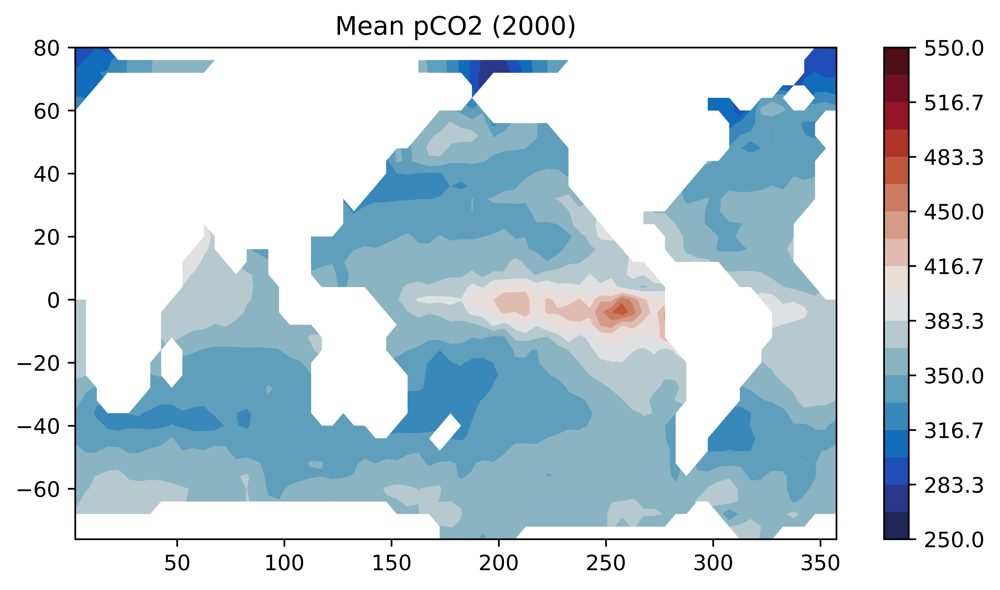

In [27]:
fig = plt.subplots(1,1,figsize=(8,4.25))
plt.contourf(taka.lon,taka.lat,pco2_mean,cmap=cm.cm.balance,levels=np.linspace(250,550,19))
plt.colorbar()
plt.title("Mean pCO2 (2000)")

/home/vbennington/.conda/envs/dev2/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)


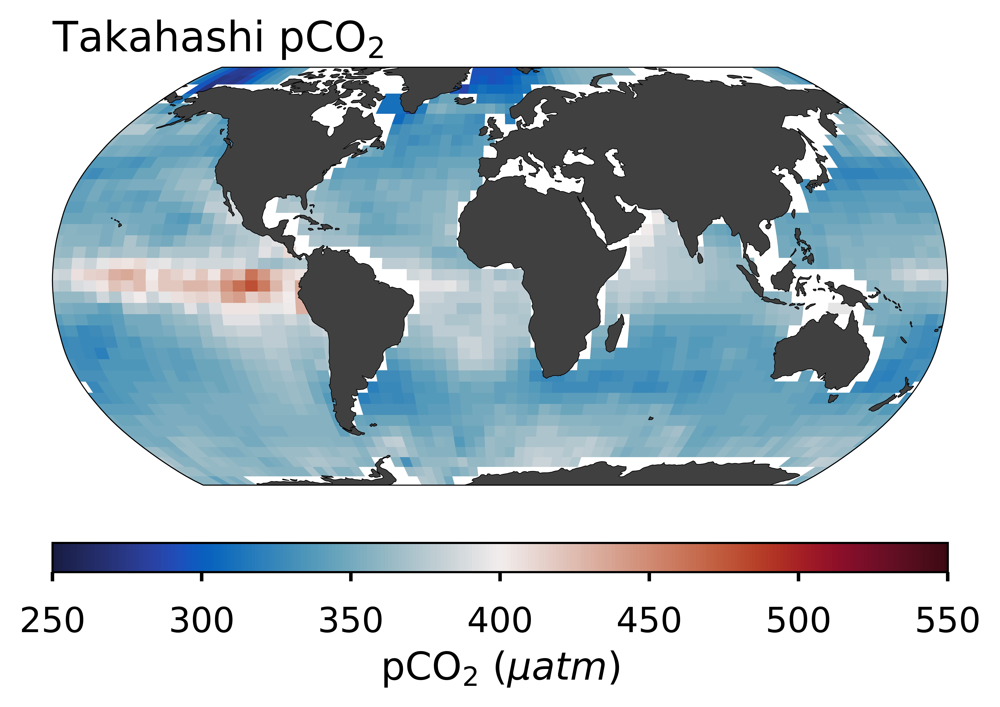

In [21]:
data_sel = "raw"
metric_sel = "bias_mean"
vrange = [250, 550, 5]
fig_shape = (1,1)
cmap = cm.cm.balance
lab = f'pCO$_2$ ($\mu atm$)'
      
with plt.style.context('seaborn-talk'):
    fig = plt.figure(figsize=(6,3.5))

    ### Mask
    dia = SpatialMap2(nrows_ncols=fig_shape, fig=fig, cbar_location='bottom', cbar_orientation='horizontal')
    data1 = pco2_mean
    wrap_data, wrap_lon = add_cyclic_point(data1.values, coord=taka.lon)
    sub = dia.add_plot(lat = pco2_mean.lat, 
                           lon = wrap_lon, 
                           data = wrap_data, 
                           vrange=vrange[0:2], 
                           cmap=cmap, 
                           ax=0)
    dia.set_title(f"Takahashi pCO$_2$", 0, loc="left")
    col = dia.add_colorbar(sub)
    dia.set_cbar_xlabel(col, lab)

In [28]:
# Will need to regrid this because it is 4x5 degrees and we need 1x1 degrees:
grid_ds = xr.open_dataset("/data/artemis/workspace/vbennington/pCO2_products/Mean_pCO2_2D_mon_1x1_198501-201812.nc")
print(grid_ds)

socat_grid = xr.Dataset({"lat":(['lat'],grid_ds.ylat.values),"lon":(['lon'],grid_ds.xlon.values)})
pco2_grid = xr.Dataset({'pco2_mean':(['lat','lon']),'lat':(['lat'],taka.lat.values),'lon':(['lon'],taka.lon.values)})

<xarray.Dataset>
Dimensions:    (xlon: 360, ylat: 180)
Coordinates:
  * ylat       (ylat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * xlon       (xlon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Data variables:
    pCO2_mean  (ylat, xlon) float64 ...


In [29]:
product_pco2_mean = grid_ds.rename({"ylat":"lat","xlon":"lon"})

In [30]:
regridder = xe.Regridder(pco2_grid, socat_grid, 'nearest_s2d')
regridder.periodic=True

Create weight file: nearest_s2d_40x72_180x360.nc


In [31]:
pco2_mean_out = regridder(pco2_mean)

pco2_mean_out = pco2_mean_out.where(product_pco2_mean.pCO2_mean > 0) 

Text(0.5, 1.0, 'Mean pCO2 (2000)')

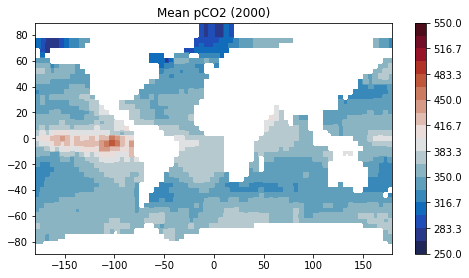

In [56]:
fig = plt.subplots(1,1,figsize=(8,4.25))
plt.contourf(pco2_mean_out.lon,pco2_mean_out.lat,pco2_mean_out,cmap=cm.cm.balance,levels=np.linspace(250,550,19))
plt.colorbar()
plt.title("Mean pCO2 (2000)")

In [57]:
# Write to file this mean pCO2 estimate:
mean_dir = "/data/artemis/workspace/vbennington/Takahashi"
fout = f"{mean_dir}/Takahashi_mean_pCO2_2D_mon_1x1_2000.nc"

ds_out = xr.Dataset(
                        {
                        'pCO2_mean':(["ylat","xlon"],pco2_mean_out)
                        },
                        coords={'ylat':(['ylat'],pco2_mean_out.lat),
                               'xlon':(['xlon'],pco2_mean_out.lon)
                               })

ds_out.to_netcdf(fout)

In [32]:
mean_dir = "/data/artemis/workspace/vbennington/Takahashi"

final_pco2 = xr.open_dataset(f"{mean_dir}/Takahashi_mean_pCO2_2D_mon_1x1_2000.nc")
print(final_pco2)
pco2_mean = final_pco2.pCO2_mean

<xarray.Dataset>
Dimensions:    (xlon: 360, ylat: 180)
Coordinates:
  * ylat       (ylat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * xlon       (xlon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Data variables:
    pCO2_mean  (ylat, xlon) float64 ...


Now have Mean pCO2

Calculate pCO2-T from mean pCO2 and satellite SST

In [33]:
def calc_pCO2T(pco2_mean,sst_series):
    
    # Use climatological pCO2 to calculate pCO2_T
    pCO2_T = pco2_mean * np.exp(0.0423* (sst_series - sst_series.mean("time")))

    pCO2_T = pCO2_T.transpose("time","ylat","xlon")
    
    return pCO2_T

In [34]:
# Load Satellite SST

sat_fname = "/data/artemis/workspace/vbennington/NOAA_SST/processed/SST_mon_198201-202012.nc"

sst_series = xr.open_dataset(f"{sat_fname}").sst    #  [0:-12,:,:]  # Don't need 2020

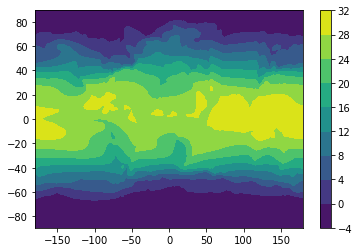

In [27]:
fig = plt.figure()
plt.contourf(sst_series.xlon,sst_series.ylat,sst_series.mean("time"))
plt.colorbar()

In [35]:
# Calculate pCO2-T from mean pCO2 and SST

pCO2_T = calc_pCO2T(pco2_mean,sst_series)

Text(0.5,1,'Mean March pCO2_T')

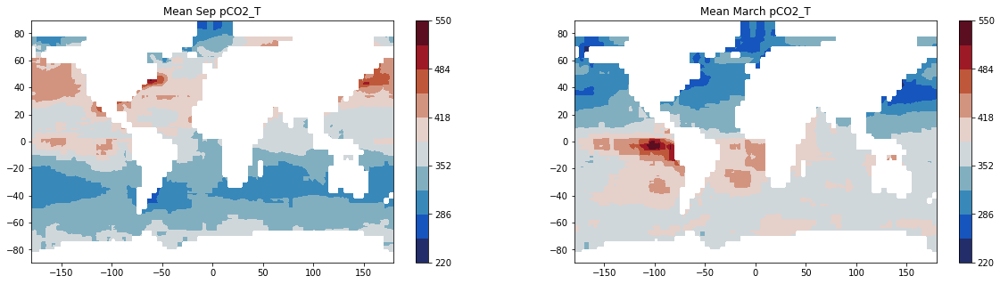

In [29]:
fig,ax = plt.subplots(1,2,figsize=(20,5))
x0=ax[0].contourf(pCO2_T.xlon,pCO2_T.ylat,pCO2_T.groupby("time.month").mean("time")[8,:,:],levels=np.linspace(220,550,11),cmap=cm.cm.balance)
plt.colorbar(x0,ax=ax[0])
ax[0].set_title("Mean Sep pCO2_T")

x0=ax[1].contourf(pCO2_T.xlon,pCO2_T.ylat,pCO2_T.groupby("time.month").mean("time")[2,:,:],levels=np.linspace(220,550,11),cmap=cm.cm.balance)
plt.colorbar(x0,ax=ax[1])
ax[1].set_title("Mean March pCO2_T")

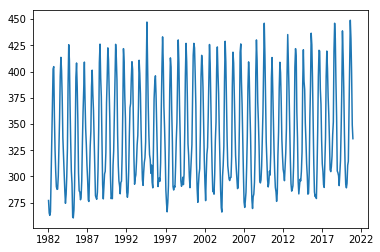

In [30]:
fig = plt.figure()
plt.plot(pCO2_T.time,pCO2_T[:,130,130])

In [31]:
# Write to file pCO2-T:

fout = f"{mean_dir}/Takahashi_mean_pCO2T_2D_mon_1x1_198201-202012.nc"

t_out = xr.Dataset(
                        {
                        'pCO2_T':(["time","ylat","xlon"],pCO2_T)
                        },
                        coords={'time':(['time'],pCO2_T.time),
                               'ylat':(['ylat'],pCO2_T.ylat),
                               'xlon':(['xlon'],pCO2_T.xlon)
                               })

t_out.to_netcdf(fout)

In [71]:
# Have mean pCO2
# Have pCO2-T calculated from mean pCO2 and satellite SST
# Have Observed "total" pCO2 at SOCAT sampling locations
# Calculate "pCO2-DIC" = pCO2 - pCO2_T for reconstruction

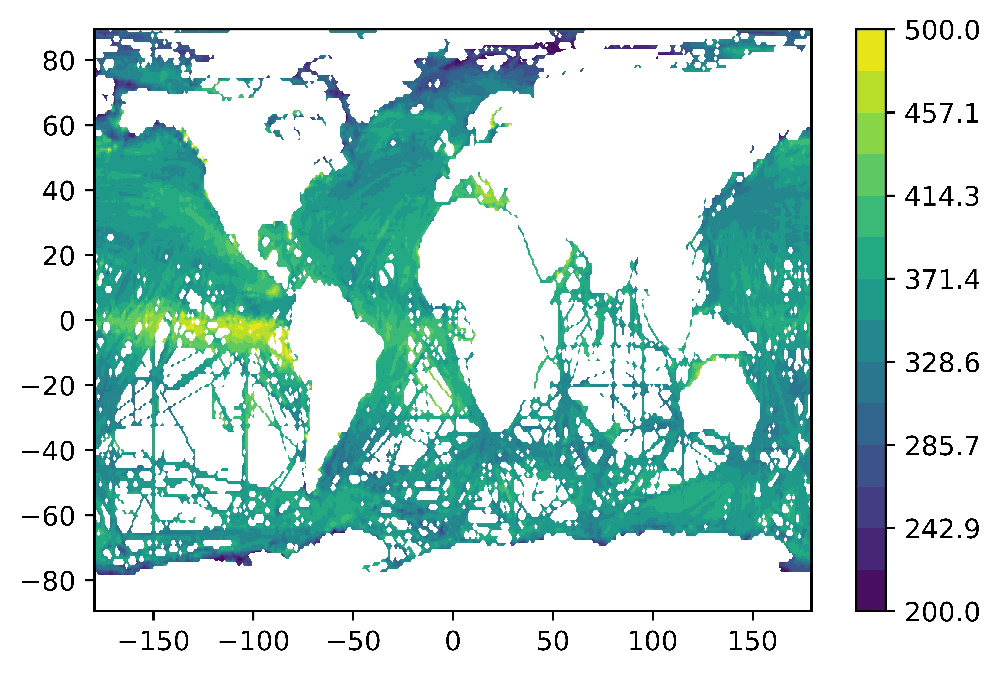

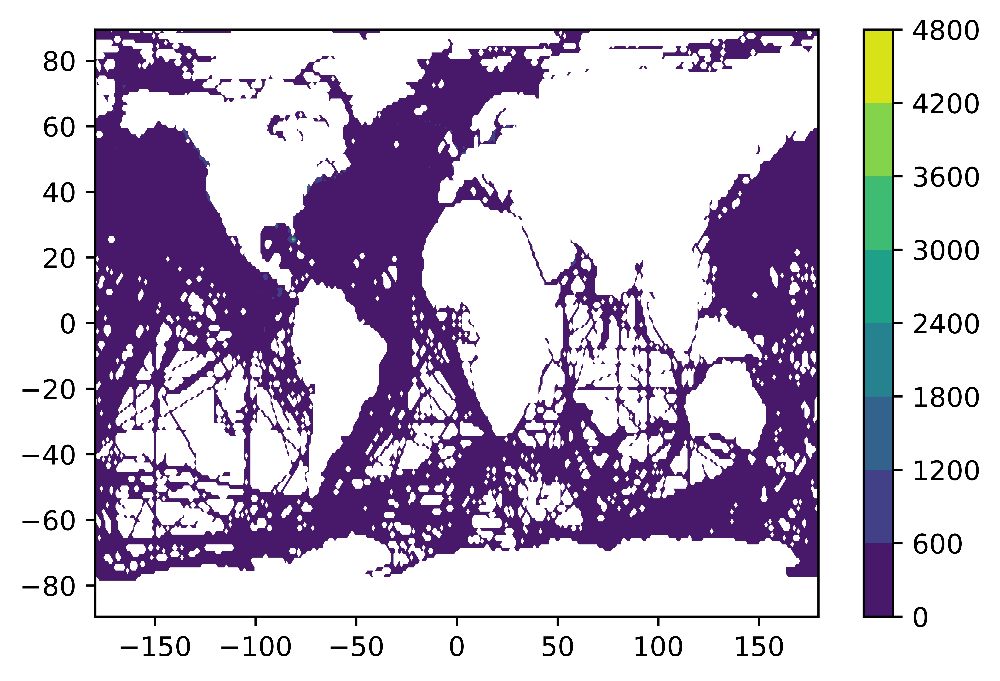

In [36]:
socat_fname = f"{socat_dir}/SOCATv2021_pCO2_gridded_monthly_satelliteSST.nc"

socat_pco2 = xr.open_dataset(f"{socat_fname}").pco2

fig = plt.figure()
plt.contourf(socat_pco2.xlon,socat_pco2.ylat,socat_pco2.mean('time'),levels = np.linspace(200,500,15))
plt.colorbar()

fig = plt.figure()
plt.contourf(socat_pco2.xlon,socat_pco2.ylat,socat_pco2.max('time'))
plt.colorbar()

In [37]:
# Look at the distribution of pCO2-SOCAT

stmp = socat_pco2.stack(z=("time","ylat","xlon"))
stmp2 = stmp[~np.isnan(stmp)]

361.43491138692434
<xarray.DataArray 'pco2' ()>
array(48.10943344)


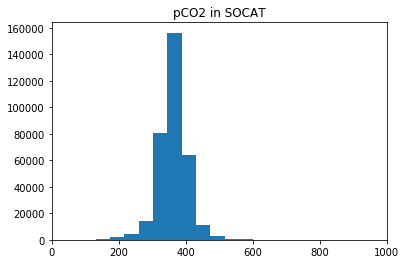

In [37]:
fig = plt.figure()
plt.hist(stmp2,100)
plt.xlim([0,1000])
plt.title("pCO2 in SOCAT")

print(np.nanmean(stmp2))
print(np.std(stmp2))

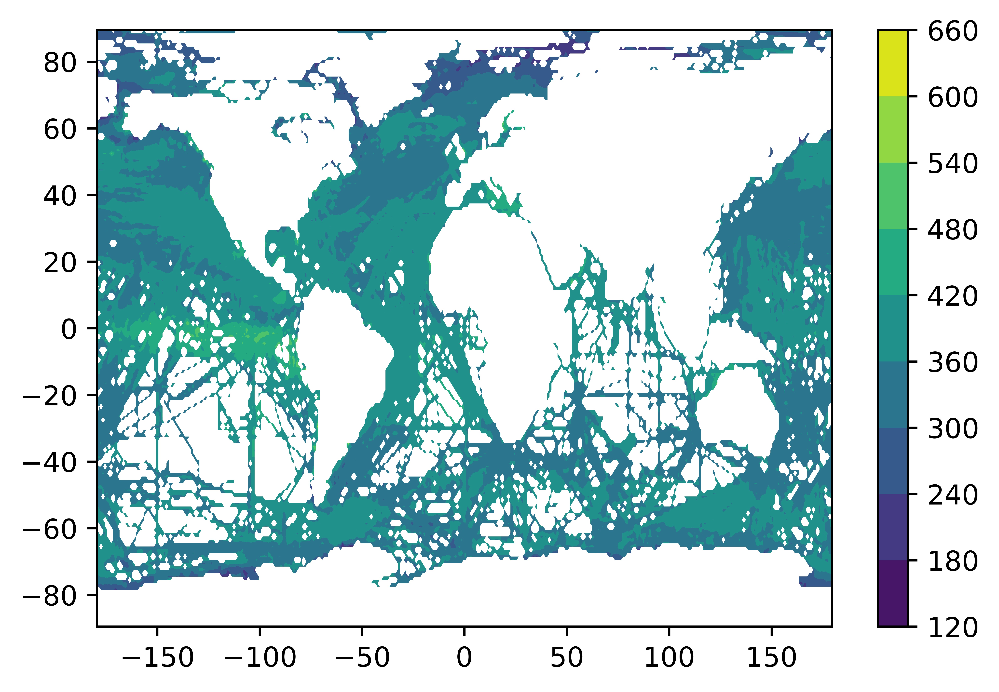

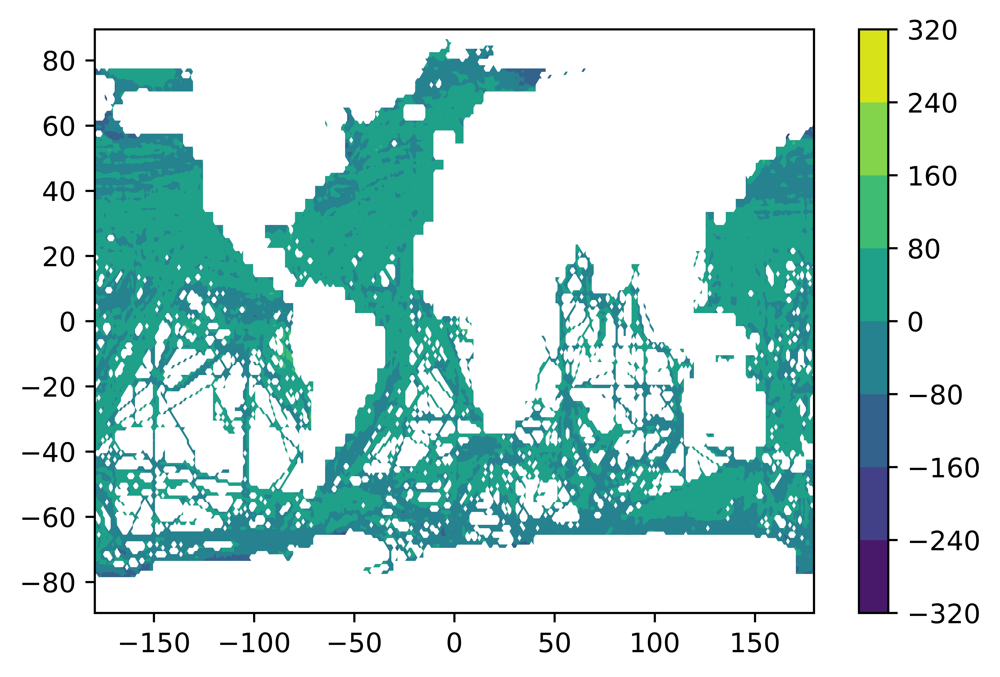

In [38]:
# Get rid of ridiculously high SOCAT pCO2
socat_pco2 = socat_pco2.where(socat_pco2 < 650)
socat_pco2 = socat_pco2.where(socat_pco2 > 175)

fig = plt.figure()
plt.contourf(socat_pco2.xlon,socat_pco2.ylat,socat_pco2.mean('time'))
plt.colorbar()

# Calculate pCO2_DIC

pCO2_DIC = socat_pco2 - pCO2_T

fig = plt.figure()
plt.contourf(pCO2_DIC.xlon,pCO2_DIC.ylat,pCO2_DIC.mean("time"))
plt.colorbar()

In [39]:
# Look at the distribution of pCO2-DIC

tmp = pCO2_DIC.stack(z=("time","ylat","xlon"))

In [40]:
tmp2 = tmp[~np.isnan(tmp)]

Text(0.5,1,'pCO2-DIC in SOCAT')

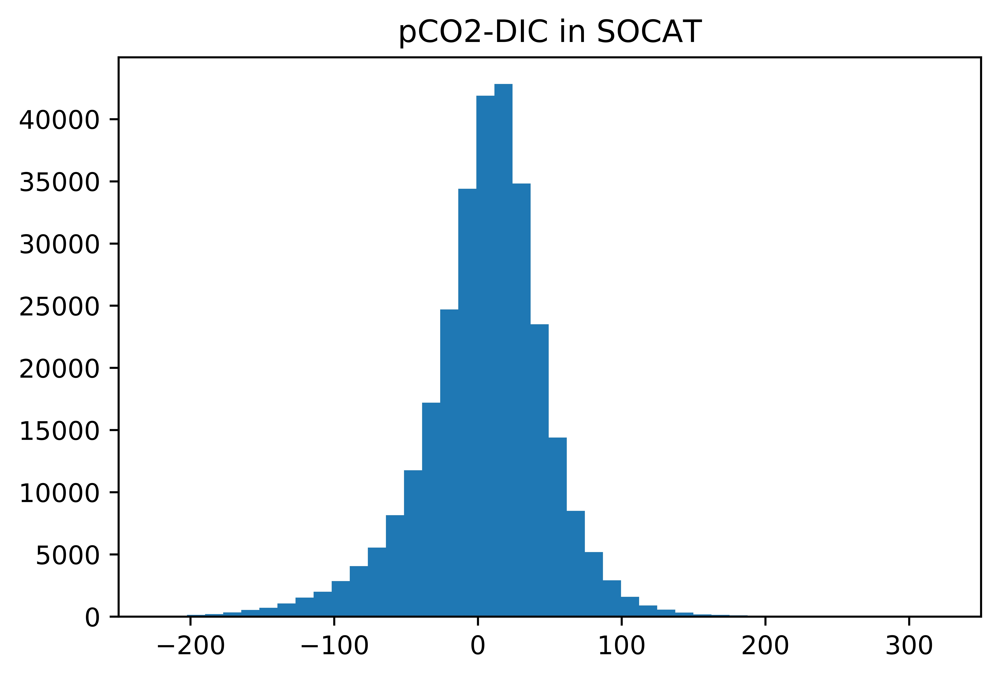

In [42]:
fig = plt.figure()
plt.hist(tmp2,50)
plt.xlim([-250,350])
#plt.ylim([0,35000])
plt.title("pCO2-DIC in SOCAT")

In [44]:
print((np.nanmean(tmp2)))

4.888614977632236


In [45]:
pCO2_DIC = pCO2_DIC.where((pCO2_DIC >-250) & (pCO2_DIC < 250))

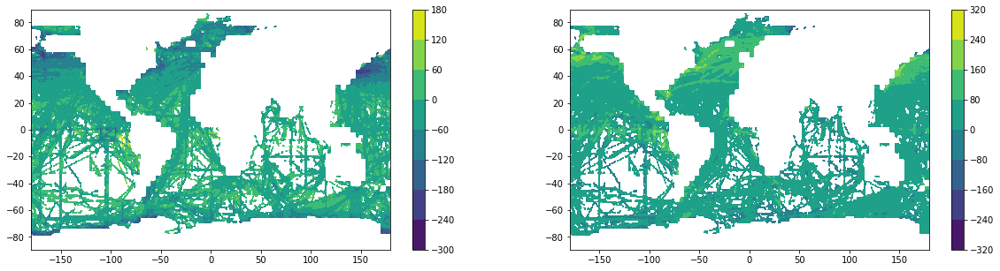

In [46]:
# Where are these observations of large/small pCO2-DIC?

fig,ax = plt.subplots(1,2,figsize=(20,5))
x0=ax[0].contourf(pCO2_DIC.xlon,pCO2_DIC.ylat,pCO2_DIC.min("time"))
plt.colorbar(x0,ax=ax[0])

x0=ax[1].contourf(pCO2_DIC.xlon,pCO2_DIC.ylat,pCO2_DIC.max("time"))
plt.colorbar(x0,ax=ax[1])

In [47]:
# Keep SOCAT pCO2 for comparison only where pCO2-DIC within reason:

socat_pco2 = socat_pco2.where(~np.isnan(pCO2_DIC))

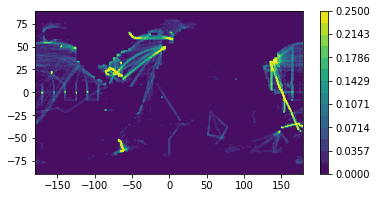

In [48]:
# make a SOCAT mask

socat_mask = socat_pco2.where(~np.isnan(socat_pco2),0)
socat_mask = socat_mask.where(socat_mask==0,1)

fig = plt.figure(figsize=(6,3))
plt.contourf(socat_mask.xlon,socat_mask.ylat,socat_mask.mean("time"),levels=np.linspace(0,.25,15))
plt.colorbar()

In [49]:
# Write out a file with pCO2_DIC, pCO2_T, and SOCAT pCO2

fout = f"{socat_dir}/SOCAT_Takahashi_pCO2_pCO2T_pCO2DIC_2D_mon_1x1_198201-202012.nc"

s_out = xr.Dataset(
                        {
                        'pCO2_T':(["time","ylat","xlon"],pCO2_T),
                        'pCO2_DIC':(["time","ylat","xlon"],pCO2_DIC),
                        'pCO2':(["time","ylat","xlon"],socat_pco2),
                        'socat_mask':(["time","ylat","xlon"],socat_mask),
                        'pCO2_mean':(["ylat","xlon"],pco2_mean)    
                        },
                        coords={'time':(['time'],pCO2_T.time),
                               'ylat':(['ylat'],pCO2_T.ylat),
                               'xlon':(['xlon'],pCO2_T.xlon)
                               })

s_out.to_netcdf(fout)

In [50]:
ds_socat = xr.open_dataset(f"{socat_dir}/SOCAT_Takahashi_pCO2_pCO2T_pCO2DIC_2D_mon_1x1_198201-202012.nc")

# Let's get number of observations, by month:
num_obs = ds_socat.pCO2_DIC.where(np.isnan(ds_socat.pCO2_DIC),1)
num_obs = num_obs.where(num_obs!=0)


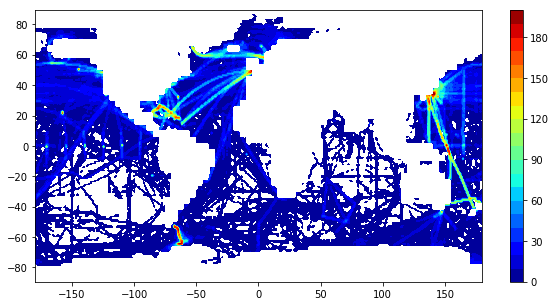

In [51]:
fig = plt.figure(figsize=(10,5))

plt.contourf(num_obs.xlon,num_obs.ylat,num_obs.sum(axis=0).where(num_obs.sum(axis=0)>0),levels=np.linspace(0,200,21),cmap='jet')
plt.colorbar()

In [6]:
%run ../_Val_Mapping.ipynb

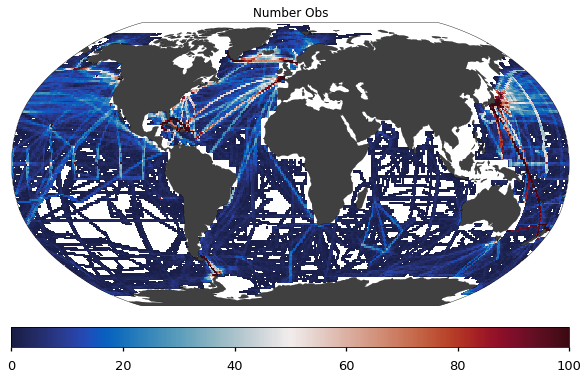

In [13]:
region='world'

cmap = cm.cm.balance  # cm.cm.balance
plot_style = 'seaborn-talk'

fig = plt.figure(figsize=(10,10))
fig_shape=(1,1)
vrange = [0, 100, 5]
    

    
    
with plt.style.context(plot_style):
    dia = SpatialMap2(nrows_ncols=fig_shape, fig=fig, cbar_location='bottom', cbar_orientation='horizontal')   
    
    data2 = num_obs.sum(axis=0).where(num_obs.sum(axis=0)>0)

    #data2 = xr_add_cyclic_point(data2, cyclic_coord='lon')    
    sub = dia.add_plot(lon=data2['xlon'], lat=data2['ylat'], data=data2, vrange=vrange[0:2], cmap=cmap, ax=0)
    dia.set_title(f"Number Obs",0,fontsize=12)
    col = dia.add_colorbar(sub)
    dia.set_cbar_xlabel(col,"",fontsize=10)

In [15]:
num_obs_bymo = num_obs.groupby("time.month").sum("time")

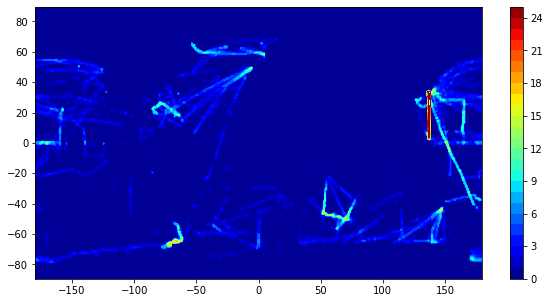

In [136]:
fig = plt.figure(figsize=(10,5))
plt.contourf(num_obs.xlon,num_obs.ylat,num_obs_bymo[0,:,:].squeeze(),levels=np.linspace(0,25,26),cmap='jet')
plt.colorbar()

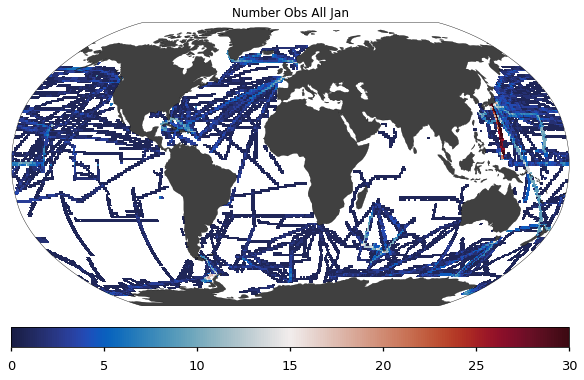

In [16]:
region='world'

cmap = cm.cm.balance  # cm.cm.balance
plot_style = 'seaborn-talk'

fig = plt.figure(figsize=(10,10))
fig_shape=(1,1)
vrange = [0, 30, 30]
    

    
    
with plt.style.context(plot_style):
    dia = SpatialMap2(nrows_ncols=fig_shape, fig=fig, cbar_location='bottom', cbar_orientation='horizontal')   
    
    data2 = num_obs_bymo[0,:,:].where(num_obs_bymo[0,:,:]>0)

    #data2 = xr_add_cyclic_point(data2, cyclic_coord='lon')    
    sub = dia.add_plot(lon=data2['xlon'], lat=data2['ylat'], data=data2, vrange=vrange[0:2], cmap=cmap, ax=0)
    dia.set_title(f"Number Obs All Jan",0,fontsize=12)
    col = dia.add_colorbar(sub)
    dia.set_cbar_xlabel(col,"",fontsize=10)

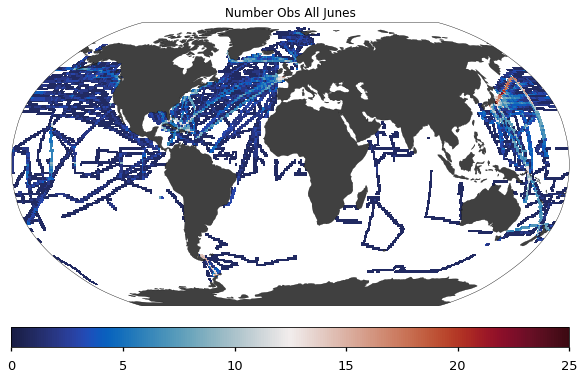

In [18]:
region='world'

cmap = cm.cm.balance  # cm.cm.balance
plot_style = 'seaborn-talk'

fig = plt.figure(figsize=(10,10))
fig_shape=(1,1)
vrange = [0, 25, 25]
    

    
    
with plt.style.context(plot_style):
    dia = SpatialMap2(nrows_ncols=fig_shape, fig=fig, cbar_location='bottom', cbar_orientation='horizontal')   
    
    data2 = num_obs_bymo[5,:,:].where(num_obs_bymo[5,:,:]>0)

    #data2 = xr_add_cyclic_point(data2, cyclic_coord='lon')    
    sub = dia.add_plot(lon=data2['xlon'], lat=data2['ylat'], data=data2, vrange=vrange[0:2], cmap=cmap, ax=0)
    dia.set_title(f"Number Obs All Junes",0,fontsize=12)
    col = dia.add_colorbar(sub)
    dia.set_cbar_xlabel(col,"",fontsize=10)

In [ ]:
socat_fname = f"{socat_dir}/SOCATv2021_pCO2_gridded_monthly_satelliteSST.nc"

